# Analytic downstream synaptic fields onto LC / LPLC visual projection neurons

For each **LC** and **LPLC** type we compute the **analytic downstream** synaptic field: the forward-flow projection from the retinal input channels **L1-L5, R7, R8** onto that neuron, indexed by each input channel's retinal coordinate. It reuses the neuron's input subgraph and propagates downstream from the channels to the neuron (no simulation needed).

- One **row per neuron** (large ylabel), one **column per input channel** (`all` first).
- LCs use `max_hops=3` (first contact with the LC from the input channels), LPLCs use `max_hops=4`.
- Each neuron's fields are cached in `fields_ds/<neuron>_analytic.npz`, so the compute step is **resumable**.

A later cell summarizes the mean/median input per neuron x channel as a log-scaled heatmap.

In [ ]:
import os
import sys

# make the flywire_tools package importable; data CSVs are read from this folder (cwd)
sys.path.insert(0, os.path.join(os.getcwd(), '..', 'src'))

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sbn
from matplotlib.colors import LogNorm

from flywire_tools.connectome import Connectome
import field_plotting as fp

def or_combine(fields, axis=0):
    """Compute the elementwise probability of at least one of these values being true"""
    if not fields:
        raise ValueError("No fields provided for combination.")
    # first, calculate the probability of non being true
    all_false = (1 - fields).prod(axis)
    # the probability of at least one being true is 1 - all_false
    return 1 - all_false

connectome = Connectome()

# LC and LPLC search parameters come from visual_neuron_types.csv (family column).
visual_neuron_types = pd.read_csv('visual_neuron_types.csv')
lc_types = fp.neuron_types(visual_neuron_types, 'LC')
lplc_types = fp.neuron_types(visual_neuron_types, 'LPLC')

# Downstream depths: LCs=3 (first contact with the LC from the input channels), LPLCs=4.
neuron_hops = {**{lc: 3 for lc in lc_types}, **{lp: 4 for lp in lplc_types}}
neurons = np.array(sorted(neuron_hops))
print(f'{len(lc_types)} LC + {len(lplc_types)} LPLC types')
# each neuron type has an associated class number ("LC01", "LPLC4", "LCe01")
# extract these numbers and sort first by cell type (LC, LPLC or LCe)
# then by class number (01, 02, 03, ...).
# note that some types have an a and b version (example: LCe01b)
cell_classes = ["LCe", "LC",  "LPLC"]
# calculate the class number for each neuron type, and sort by cell class and class number
inds = np.zeros(len(neurons), dtype=int)
inds.fill(-1)
last_num = 0
for cell_class in cell_classes:
    # check all neurons that haven't been assigned yet
    for i, neuron in zip(np.where(inds == -1)[0], neurons[inds == -1]):
        if neuron.startswith(cell_class):
            # split by any letter and take the first part, which is the class number
            # use a regex to extract the number from the neuron type string
            import re
            match = re.search(r'\d+', neuron)
            number = int(match.group()) if match else 0
            inds[i] = last_num + number
    last_num = inds.max()
neurons = neurons[inds.argsort()]
neurons

## Compute (or load) the downstream analytic fields

This is the long step: one downstream analytic run per neuron, for a single optic lobe (`SIDE`). Each result is cached to `fields_ds_<side>/`, so this cell is safe to interrupt and re-run (already-computed neurons load instantly). To run everything (both eyes) unattended in the background instead, use `compute_downstream.py`.

In [217]:
SIDE = 'right'   # analyze one optic lobe; recompute with 'left' as a ground-truth check
all_fields = {}
for num, (neuron, hops) in enumerate(neuron_hops.items(), 1):
    try:
        all_fields[neuron] = fp.compute_downstream_or_load(
            connectome, neuron, hops, cache_dir=f'fields_ds_{SIDE}', side=SIDE)
        print(f'[{num}/{len(neuron_hops)}] {neuron}: ok')
    except Exception as exc:
        print(f'[{num}/{len(neuron_hops)}] {neuron}: FAILED {type(exc).__name__}: {exc}')
print(f'loaded {len(all_fields)} / {len(neuron_hops)} neurons (side={SIDE})')

[1/59] LCe01b: ok
[2/59] LCe01: FAILED NoMatchesError: No neurons found matching the given criteria.
[3/59] LCe01a: ok
[4/59] LCe02: ok
[5/59] LCe03: ok
[6/59] LC4: ok
[7/59] LCe04: ok
[8/59] LCe05: ok
[9/59] LCe06: ok
[10/59] LC6: ok
[11/59] LCe07: ok
[12/59] LCe08: ok
[13/59] LC9: ok
[14/59] LCe09: ok
[15/59] LC10e: ok
[16/59] LC10d: ok
[17/59] LC10a: ok
[18/59] LC10c: ok
[19/59] LC10b: ok
[20/59] LC10f: ok
[21/59] LC11: ok
[22/59] LC12: ok
[23/59] LC13: ok
[24/59] LC14b: ok
[25/59] LC14a1: ok
[26/59] LC14a2: ok
[27/59] LC15: ok
[28/59] LC16: ok
[29/59] LC17: ok
[30/59] LC18: ok
[31/59] LC19: ok
[32/59] LC20b: ok
[33/59] LC20a: ok
[34/59] LC21: ok
[35/59] LC22: ok
[36/59] LC24: ok
[37/59] LC25: ok
[38/59] LC26: ok
[39/59] LC27: ok
[40/59] LC28a: ok
[41/59] LC29: ok
[42/59] LC31b: ok
[43/59] LC31a: ok
[44/59] LC31c: ok
[45/59] LC33a: FAILED NoMatchesError: No neurons found matching the given criteria.
[46/59] LC34: ok
[47/59] LC35: ok
[48/59] LC36: ok
[49/59] LC37a: FAILED NoMatchesEr

## Synaptic field grid

One row per neuron (large ylabel), one column per input channel with `all` first. The seven input channels share a single log color scale (pooled across every neuron); `all` has its own shared scale.

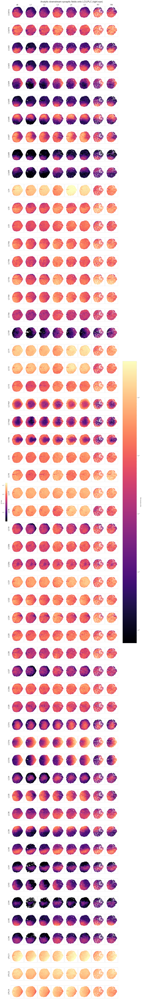

In [219]:
plotted = [n for n in neurons if n in all_fields]
fig, axes = fp.plot_field_grid(
    all_fields, plotted,
    out_png='analytic_downstream_fields_grid.png',
    cmap='magma',
    title=f'Analytic downstream synaptic fields onto LC/LPLC ({SIDE} eye)')
plt.show()

## Summary heatmap

For each neuron x channel (and `all`) we take the field's total (summed over retinal positions) and summarize it with the **mean** and **median**. Both are shown on a single log-scaled colormap.

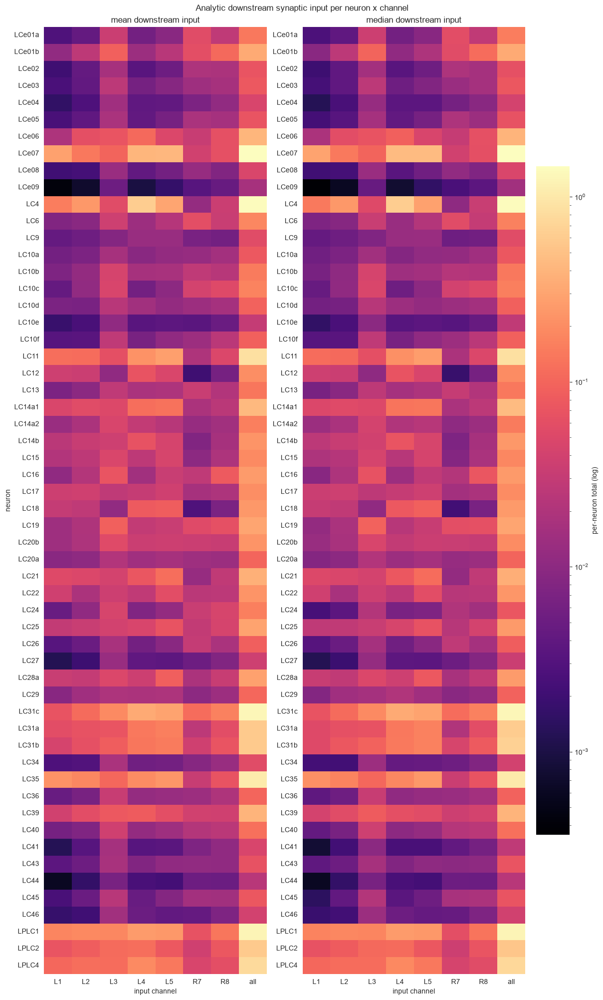

,L1,L2,L3,L4,L5,R7,R8,all
LCe01a,0.002781,0.004280,0.034618,0.005958,0.009240,0.055566,0.027668,0.140029
LCe01b,0.011034,0.026373,0.092092,0.013363,0.023959,0.059464,0.108496,0.333963
LCe02,0.001994,0.004235,0.016683,0.003356,0.005277,0.018921,0.018740,0.069091
LCe03,0.002553,0.004078,0.025907,0.006016,0.008688,0.014352,0.016490,0.078050
LCe04,0.001578,0.002719,0.014755,0.004044,0.004176,0.007250,0.010972,0.045463
LCe05,0.002473,0.004026,0.018150,0.004186,0.006304,0.018132,0.016091,0.069319
LCe06,0.019208,0.060920,0.069870,0.106932,0.048837,0.032141,0.063947,0.401310
LCe07,0.283835,0.136652,0.096169,0.404092,0.424308,0.039602,0.063327,1.442192
LCe08,0.002099,0.002284,0.013057,0.004094,0.005910,0.011976,0.007983,0.047385
LCe09,0.000429,0.000712,0.005182,0.000960,0.001678,0.003340,0.004555,0.016852


In [ ]:
channels = fp.STARTING_POINTS + ['all']
mean_df = fp.summary_table(all_fields, plotted, channels=channels, stat='mean')
median_df = fp.summary_table(all_fields, plotted, channels=channels, stat='median')
# normalize the mean and median values to the 

# single shared log color scale across both statistics
vals = np.concatenate([mean_df.values.ravel(), median_df.values.ravel()])
vals = vals[np.isfinite(vals) & (vals > 0)]
norm = LogNorm(vmin=vals.min(), vmax=vals.max())

fig, axes = plt.subplots(1, 2, figsize=(12, 0.32 * len(plotted) + 2), constrained_layout=True)
for ax, df, name in zip(axes, [mean_df, median_df], ['mean', 'median']):
    sbn.heatmap(df, ax=ax, cmap='magma', norm=norm, cbar=(name == 'median'),
                cbar_kws={'label': 'per-neuron total (log)'})
    ax.set_title(f'{name} downstream input')
    ax.set_xlabel('input channel')
axes[0].set_ylabel('neuron')
fig.suptitle('Analytic downstream synaptic input per neuron x channel')
fig.savefig('analytic_downstream_summary_heatmap.png', dpi=150, bbox_inches='tight')
plt.show()

## Phase 1 — Sensitivity / gain

For each neuron we compute a per-pixel **sensitivity**: the probability that *at least one* input signal reaches *at least one* of the neuron's target cells,
$$\text{sens}[p] = 1 - \prod_t \bigl(1 - \text{all}[t,p]\bigr),$$
i.e. the OR (over target replicates) of the `all` field. This gives one ~800-pixel distribution per neuron. We bootstrap the 95% CI of both the **mean** and the **median** over the (positive) pixels; comparing them flags whether a distribution is substantially **skewed** (many near-zero pixels with a bright core -> mean > median). The median is the robust per-neuron gain used to normalize the fields in Phase 2.

In [ ]:
sens_summary.round(4)

,mean,lo,hi,median,med_lo,med_hi,skew,n_px
LCe01a,0.0021,0.0019,0.0023,0.0012,0.0010,0.0014,0.0009,796.0
LCe01b,0.0096,0.0091,0.0101,0.0080,0.0074,0.0088,0.0016,796.0
LCe02,0.0024,0.0021,0.0027,0.0002,0.0001,0.0003,0.0022,796.0
LCe03,0.0024,0.0022,0.0027,0.0004,0.0003,0.0006,0.0021,796.0
LCe04,0.0010,0.0009,0.0012,0.0002,0.0002,0.0003,0.0008,795.0
LCe05,0.0007,0.0006,0.0008,0.0001,0.0001,0.0001,0.0006,796.0
LCe06,0.0030,0.0027,0.0034,0.0005,0.0004,0.0006,0.0025,796.0
LCe07,0.0108,0.0102,0.0115,0.0087,0.0070,0.0100,0.0021,796.0
LCe08,0.0002,0.0002,0.0003,0.0000,0.0000,0.0000,0.0002,796.0
LCe09,0.0002,0.0002,0.0002,0.0001,0.0000,0.0001,0.0001,795.0


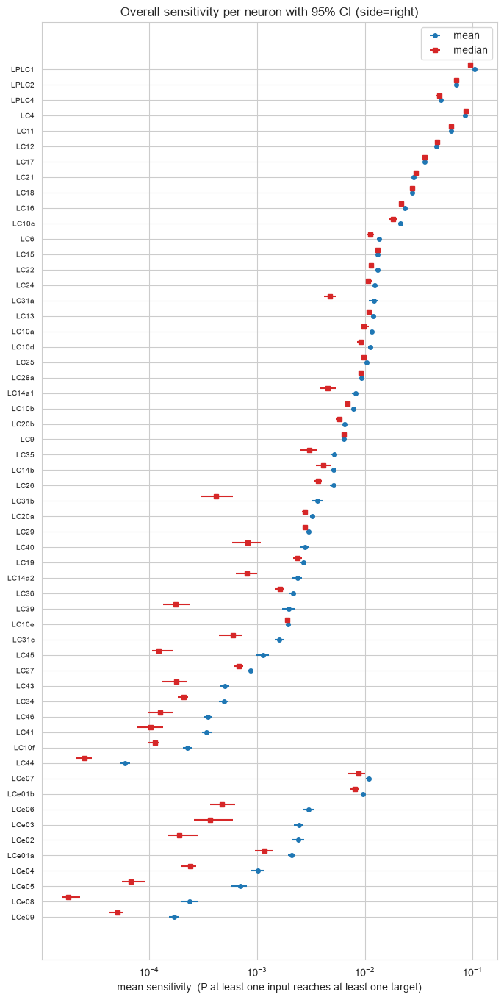

In [ ]:
import importlib
import field_plotting
importlib.reload(field_plotting)   # refresh module so sens_summary has the new columns
import field_plotting as fp

# per-neuron sensitivity summary: mean & median with bootstrap 95% CIs (mean vs median => skew)
sens_summary = fp.sensitivity_summary(all_fields, plotted, reps=10000, confidence=95)

# overall sensitivity per neuron: all-pixel mean vs foreground mean, with 95% CIs
def _class_rank(name):
    for i, c in enumerate(cell_classes):
        if name.startswith(c):
            return i
    return len(cell_classes)

# order by cell class (LCe, LC, LPLC) then by mean sensitivity within class
s = sens_summary.loc[plotted].copy()
s['_cls'] = [_class_rank(n) for n in s.index]
s = s.sort_values(['_cls', 'mean']).drop(columns='_cls')
labels = list(s.index)
y = np.arange(len(labels))
fig, ax = plt.subplots(figsize=(8, 0.26 * len(plotted) + 2))
ax.errorbar(s['mean'], y, xerr=[s['mean'] - s['lo'], s['hi'] - s['mean']],
            fmt='o', ms=4, color='tab:blue', label='mean')
ax.errorbar(s['median'], y + 0.3, xerr=[s['median'] - s['med_lo'], s['med_hi'] - s['median']],
            fmt='s', ms=4, color='tab:red', label='median')
ax.set_yticks(y)
ax.set_yticklabels(labels, fontsize=7)
ax.set_xscale('log')
# ax.invert_yaxis()
ax.set_xlabel('mean sensitivity  (P at least one input reaches at least one target)')
ax.set_title(f'Overall sensitivity per neuron with 95% CI (side={SIDE})')
ax.legend()

#fig.savefig(f'sensitivity_means_{SIDE}.png', dpi=150, bbox_inches='tight')
plt.show()

## Phase 2 — Input-channel pattern (gain-normalized) + assumption check

To separate the **pattern** of input channels from the overall **gain**, each channel's OR-over-targets reach field is divided by the neuron's median sensitivity (its gain), then averaged over pixels. In the summary heatmap the seven input channels show this gain-normalized pattern; the `all` column is replaced by the raw **median sensitivity** (gain) on a separate colormap.

We then check the key assumption (your prior HOSVD~=SVD finding): that each input-specific field is essentially a **scaled copy of the combined `all` field**. For each neuron x channel we fit the best scalar $a$ (minimizing $\lVert f_\text{ch}-a\,f_\text{all}\rVert$) and report the residual fraction and correlation - low residual / high correlation means the assumption holds, and the high-residual entries are the important exceptions.

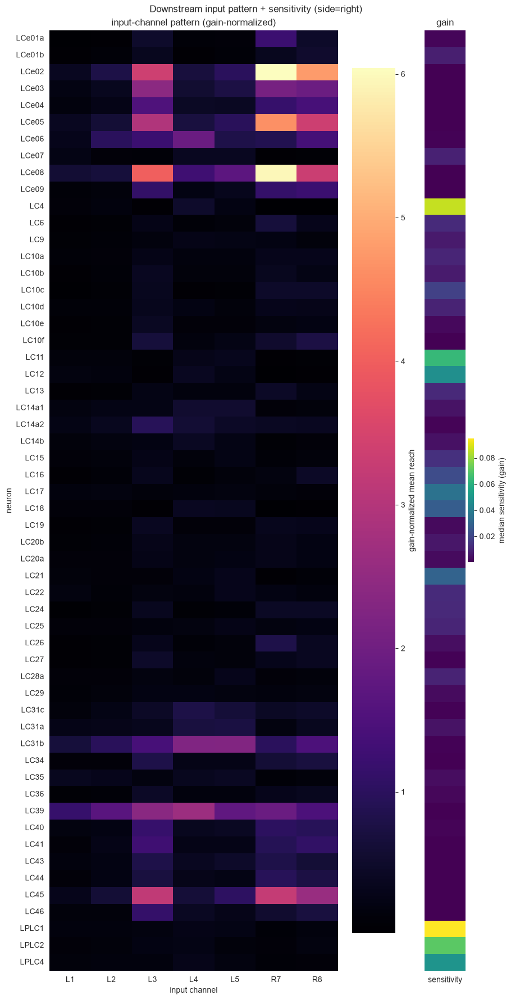

,L1,L2,L3,L4,L5,R7,R8
LCe01a,0.036,0.056,0.488,0.086,0.122,1.227,0.484
LCe01b,0.040,0.096,0.362,0.054,0.088,0.361,0.522
LCe02,0.375,0.792,3.362,0.694,0.998,6.043,4.779
LCe03,0.219,0.350,2.397,0.571,0.755,2.092,1.942
LCe04,0.162,0.259,1.517,0.426,0.403,1.159,1.399
LCe05,0.375,0.609,2.955,0.701,0.963,4.640,3.346
LCe06,0.313,0.983,1.219,1.911,0.800,0.879,1.378
LCe07,0.247,0.119,0.090,0.389,0.375,0.059,0.073
LCe08,0.599,0.650,4.002,1.285,1.692,5.966,3.315
LCe09,0.087,0.142,1.117,0.212,0.339,1.137,1.235


In [235]:
# gain-normalized input pattern (magma) + sensitivity gain column (viridis)
gnorm = fp.gain_normalized_summary(all_fields, plotted, sens_summary)
gain = sens_summary.loc[plotted, 'median']

fig, (axL, axR) = plt.subplots(
    1, 2, figsize=(9, 0.28 * len(plotted) + 2),
    gridspec_kw={'width_ratios': [len(gnorm.columns), 1]}, constrained_layout=True)
sbn.heatmap(gnorm, ax=axL, cmap='magma', cbar_kws={'label': 'gain-normalized mean reach'})
axL.set_title('input-channel pattern (gain-normalized)')
axL.set_xlabel('input channel')
axL.set_ylabel('neuron')
sbn.heatmap(gain.to_frame('sensitivity'), ax=axR, cmap='viridis', yticklabels=False,
            cbar_kws={'label': 'median sensitivity (gain)'})
axR.set_title('gain')
fig.suptitle(f'Downstream input pattern + sensitivity (side={SIDE})')
fig.savefig(f'input_pattern_sensitivity_{SIDE}.png', dpi=150, bbox_inches='tight')
plt.show()
gnorm.round(3)

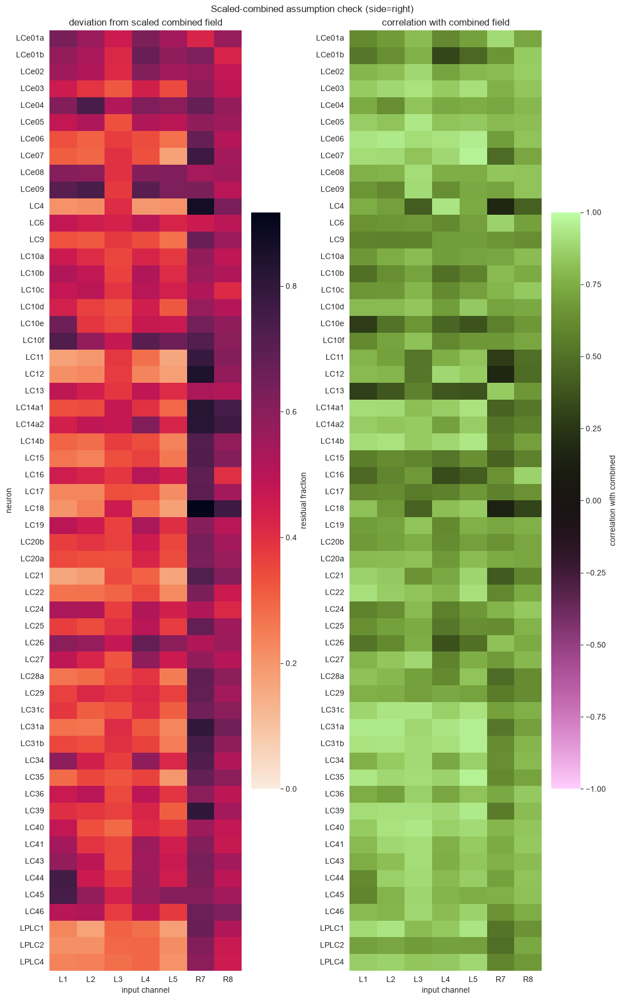

,,residual_fraction
LC18,R7,0.917298
LC4,R7,0.871355
LC12,R7,0.847251
LC14a1,R7,0.820868
LC14a2,R7,0.818624
LC39,R7,0.799215
LC31a,R7,0.798983
LC11,R7,0.783781
LC14a2,R8,0.773817
LCe07,R7,0.772761


In [225]:
# assumption check: is each channel's reach ~ a scaled copy of the combined 'all' field?
resid_df, corr_df = fp.combined_scaling_check(all_fields, plotted)
fig, axes = plt.subplots(1, 2, figsize=(11, 0.28 * len(plotted) + 2), constrained_layout=True)
sbn.heatmap(resid_df, ax=axes[0], cmap='rocket_r', vmin=0,
            cbar_kws={'label': 'residual fraction'})
axes[0].set_title('deviation from scaled combined field')
axes[0].set_xlabel('input channel')
axes[0].set_ylabel('neuron')
sbn.heatmap(corr_df, ax=axes[1], cmap='vanimo', vmin=-1, vmax=1,
            cbar_kws={'label': 'correlation with combined'})
axes[1].set_title('correlation with combined field')
axes[1].set_xlabel('input channel')
fig.suptitle(f'Scaled-combined assumption check (side={SIDE})')
fig.savefig(f'scaling_assumption_{SIDE}.png', dpi=150, bbox_inches='tight')
plt.show()

# biggest exceptions: channel fields least well described by a scaled combined field
resid_df.stack().sort_values(ascending=False).head(15).to_frame('residual_fraction')

## Phase 3 — Spatial receptive-field taxonomy

We treat each neuron's gain-normalized sensitivity field as an $N$-pixel vector, giving an $M\times N$ matrix (neurons x pixels). SVD reduces the pixel dimension (keeping enough components for >=90% of the variance), and we cluster the neurons in that reduced space with cosine geometry - **HDBSCAN** (primary) and **agglomerative** (cross-check) - to build a taxonomy of receptive-field shapes.

RF matrix (56, 776); kept 31 components for >=95% variance


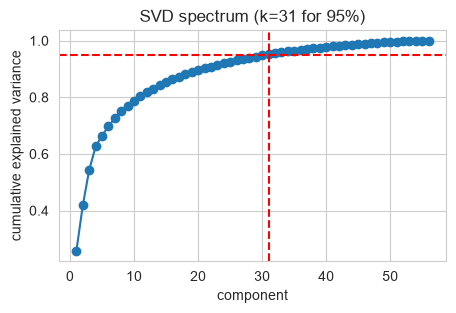

In [226]:
# build M x N RF matrix (gain-normalized sensitivity), reduce with SVD to >=90% variance
# TODO: use 95% as threshold
thresh = .95

# deep-copy the nested field dict so normalization below does not mutate all_fields
all_fields_scaled = {
    neuron: type(flds)({channel: field.copy() for channel, field in flds.items()})
    for neuron, flds in all_fields.items()
}
fields_scaled = {}
combined_field = np.zeros_like(all_fields['LC11']['all'][0])
for neuron in all_fields_scaled:
    field = all_fields_scaled[neuron]['L5'].copy()
    total = field.sum()
    combined_field += total
    for channel in all_fields_scaled[neuron]:
        field = all_fields_scaled[neuron][channel].copy()
        total = field.sum()
        combined_field += total
        if neuron not in fields_scaled:
            fields_scaled[neuron] = {}
        fields_scaled[neuron][channel] = field / total
# now, use this to make a mask
mask = combined_field > 0

x, keep = fp.rf_matrix(fields_scaled, plotted, sens_summary, normalize='zscore', channel='L5')
scores, s, ev, k = fp.svd_reduce(x, var_threshold=thresh)
print(f'RF matrix {x.shape}; kept {k} components for >={thresh*100:.0f}% variance')

fig, ax = plt.subplots(figsize=(5, 3))
ax.plot(np.arange(1, len(ev) + 1), np.cumsum(ev), 'o-')
ax.axhline(thresh, color='r', ls='--')
ax.axvline(k, color='r', ls='--')
ax.set_xlabel('component')
ax.set_ylabel('cumulative explained variance')
ax.set_title(f'SVD spectrum (k={k} for {thresh*100:.0f}%)')
plt.show()

def svd_approx(neuron='all', channel=0):
    """Reconstruct a single channel's field from the SVD components"""
    if neuron not in plotted:
        raise ValueError(f'Neuron {neuron} not in plotted neurons')
    if channel not in all_fields_scaled[neuron]:
        raise ValueError(f'Channel {channel} not in neuron {neuron}')
    # get the original field
    field = all_fields_scaled[neuron][channel]
    # project onto the SVD components
    coeffs = scores[plotted.index(neuron), :k]
    approx = np.zeros_like(field)
    for i in range(k):
        approx += coeffs[i] * s[i, :].reshape(field.shape)
    return approx 

In [227]:
# cluster neurons in reduced RF space: HDBSCAN (primary) + agglomerative (cross-check)
lab_hdb = fp.cluster_rfs(scores, method='hdbscan', min_cluster_size=2)
tax = pd.DataFrame({'neuron': plotted, 'hdbscan': lab_hdb})
for k_agg in [2, 4, 8, 16, 32]:
    tax[f'agg{k_agg}'] = fp.cluster_rfs(scores, method='agglomerative', n_clusters=k_agg)
tax.set_index('neuron')

,hdbscan,agg2,agg4,agg8,agg16,agg32
neuron,,,,,,
LCe01a,4,1,1,2,4,7
LCe01b,-1,0,2,0,7,24
LCe02,4,1,1,2,4,7
LCe03,4,1,1,2,4,7
LCe04,1,0,0,1,5,8
LCe05,4,1,1,2,4,0
LCe06,3,0,2,0,0,3
LCe07,5,1,1,2,10,4
LCe08,4,1,1,2,4,0


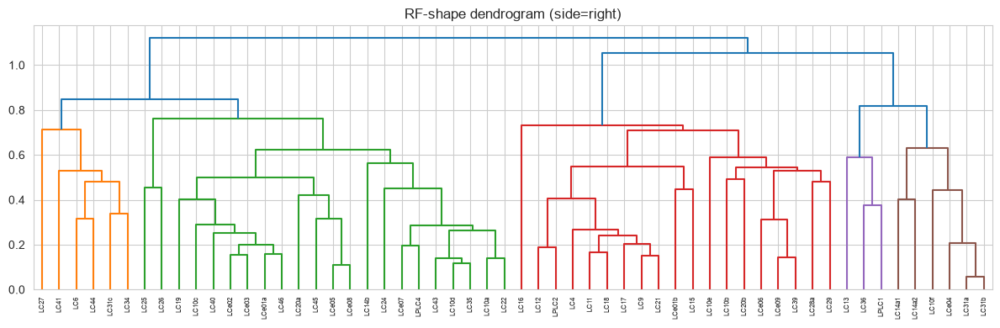

In [228]:
# dendrogram (cosine, average linkage) in reduced RF space
from scipy.cluster.hierarchy import linkage, dendrogram
from scipy.spatial.distance import pdist
Z = linkage(pdist(scores, metric='cosine'), method='average')
fig, ax = plt.subplots(figsize=(12, 4))
dendrogram(Z, labels=list(plotted), leaf_rotation=90, ax=ax, color_threshold=0.8)
ax.set_title(f'RF-shape dendrogram (side={SIDE})')
plt.tight_layout()
plt.show()

SVD model: k=31 components, 100.0% variance retained


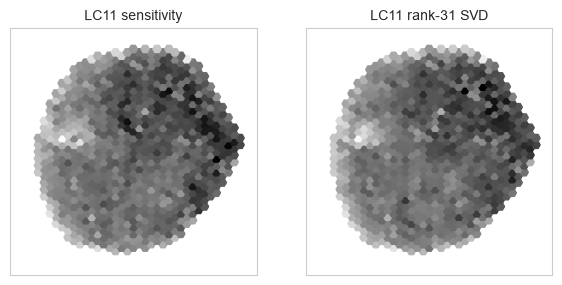

In [229]:
# import importlib
# import field_plotting
# importlib.reload(field_plotting)   # pick up newly added helpers without restarting the kernel
# import field_plotting as fp
# make a version of all_fields that is scaled to the mean sensitivity of each neuron, for downstream analysis

# make a version of all_fields using the k=7 SVD components, to use for downstream analysis
# each svd neuron -> SynapticFields with a single 'all' frame (the rank-k reconstruction,
# back in probability units); sensitivity_field / rf_matrix / plot_rf_taxonomy work on it.
all_fields_svd, svd_info = fp.rf_svd_model(all_fields, plotted, sens_summary, k=k)
print(f"SVD model: k={svd_info['k']} components, "
      f"{np.cumsum(svd_info['ev'])[svd_info['k'] - 1]:.1%} variance retained")

# compare original vs SVD reconstruction for one neuron
demo = 'LC11'
orig = fp.sensitivity_field(all_fields_scaled[demo])
recon = fp.sensitivity_field(all_fields_svd[demo])
fig, axs = plt.subplots(1, 2, figsize=(7, 3.5))
ref = all_fields[demo]['L5']
for ax, img, ttl in zip(axs, [orig, recon], [f'{demo} sensitivity', f'{demo} rank-{svd_info["k"]} SVD']):
    f2d = type(ref)(img[None], ps=ref.ps, qs=ref.qs)
    from matplotlib.colors import Normalize
    fp.draw_hex(ax, f2d, norm=Normalize(0, float(orig.max()) or 1.0), axis_lim=90)
    ax.set_title(ttl, fontsize=10)
plt.show()

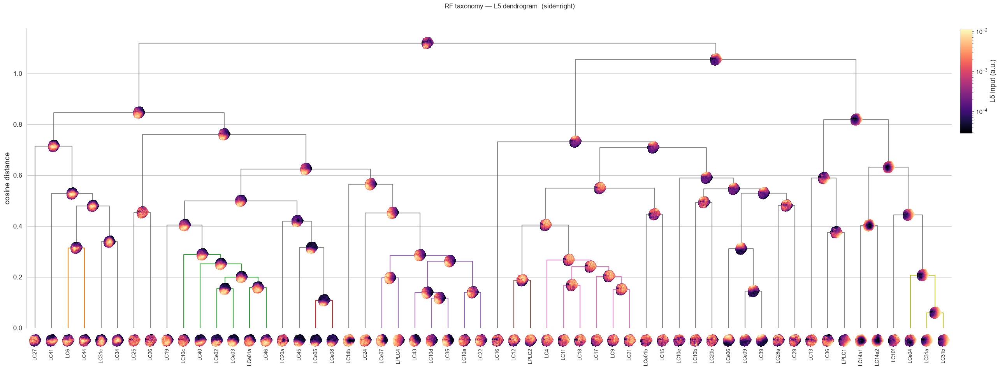

In [230]:
import importlib, field_plotting; importlib.reload(field_plotting); import field_plotting as fp

fig, ax_dend, leaf_axes = fp.plot_dendrogram_with_fields(
    fields_scaled, plotted, scores, x, keep,
    channel='L5',
    n_clusters=32,        # branch colouring matches agg32
    log_norm=True,
    min_members=2,        # every merge node gets a panel
    leaf_panel=0.45,      # ~26" wide for 56 neurons
    axis_lim=90,
    cmap='magma',
)
fig.suptitle(f'RF taxonomy — L5 dendrogram  (side={SIDE})', y=1.002)
fig.savefig(f'rf_dendrogram_{SIDE}.png', dpi=150, bbox_inches='tight')
plt.show()

RF matrix (56, 776); kept 31 components for >=95% variance


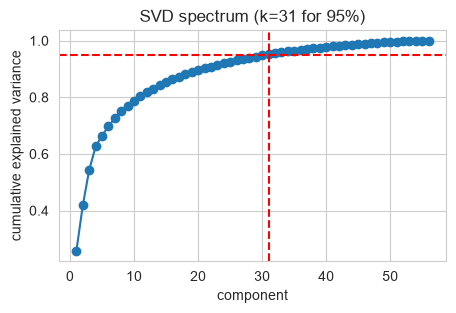

In [231]:
thresh = .95

# deep-copy the nested field dict so normalization below does not mutate all_fields
all_fields_scaled = {
    neuron: type(flds)({channel: field.copy() for channel, field in flds.items()})
    for neuron, flds in all_fields.items()}
fields_scaled = {}
combined_field = np.zeros_like(all_fields['LC11']['all'][0])
for neuron in all_fields_scaled:
    field = all_fields_scaled[neuron]['L5'].copy()
    total = field.sum()
    combined_field += total
    for channel in all_fields_scaled[neuron]:
        field = all_fields_scaled[neuron][channel].copy()
        total = field.sum()
        combined_field += total
        if neuron not in fields_scaled:
            fields_scaled[neuron] = {}
        fields_scaled[neuron][channel] = field / total

x, keep = fp.rf_matrix(fields_scaled, plotted, sens_summary, normalize='zscore', channel='L5')

# 'combined_field' accumulates scalars (totals), not spatial values, so mask = combined_field > 0
# would be all-True. Use 'keep' from rf_matrix instead — it correctly marks valid pixels.
mask = keep.reshape(combined_field.shape)

scores, s, ev, k = fp.svd_reduce(x, var_threshold=thresh)
print(f'RF matrix {x.shape}; kept {k} components for >={thresh*100:.0f}% variance')

fig, ax = plt.subplots(figsize=(5, 3))
ax.plot(np.arange(1, len(ev) + 1), np.cumsum(ev), 'o-')
ax.axhline(thresh, color='r', ls='--')
ax.axvline(k, color='r', ls='--')
ax.set_xlabel('component')
ax.set_ylabel('cumulative explained variance')
ax.set_title(f'SVD spectrum (k={k} for {thresh*100:.0f}%)')
plt.show()

def svd_approx(neuron='all', channel=0):
    """Reconstruct a single channel's field from the SVD components"""
    if neuron not in plotted:
        raise ValueError(f'Neuron {neuron} not in plotted neurons')
    if channel not in all_fields_scaled[neuron]:
        raise ValueError(f'Channel {channel} not in neuron {neuron}')
    # get the original field
    field = all_fields_scaled[neuron][channel]
    # project onto the SVD components
    coeffs = scores[plotted.index(neuron), :k]
    approx = np.zeros_like(field)
    for i in range(k):
        approx += coeffs[i] * s[i, :].reshape(field.shape)
    return approx

In [232]:
import importlib, field_plotting; importlib.reload(field_plotting); import field_plotting as fp

cluster_map = {
'midline': ['LC14a1', 'LC14a2'],
'posterior': ['LC31a', 'LC31b', 'LCe04', 'LC10f'],
'dorso-anterior': ['LCe06', 'LC39'],
'dorso-posterior': ['LC15', 'LC9', 'LC17', 'LC4', 'LC18', 'LC11', 'LC21'],
'central equatorial': ['LC19', 'LC20b', 'LC31c', 'LC41', 'LC34', 'LC12', 'LC27'],
'anterior': ['LC14b', 'LC43', 'LC10d', 'LC35', 'LC10a', 'LCe07', 'LPLC4', 'LCe01a', 'LC24'],
'ventral': ['LC40', 'LCe03', 'LC20a', 'LCe02', 'LC46', 'LC45', 'LCe05', 'LCe08'],
}
neuron_to_cluster = {n: c for c, ns in cluster_map.items() for n in ns}
manual_labels = [neuron_to_cluster.get(n, None) for n in plotted]
unlabeled = [n for n in plotted if n not in neuron_to_cluster]
if unlabeled:
    print(f'Unlabeled (gray): {unlabeled}')

# flip_pcs negates specific SVD components (sign is arbitrary); pass e.g. flip_pcs=[0] to mirror PC1
html_path = fp.write_svd_scatter_html(
plotted, scores, fields_scaled,
channel='L5',
pc_x=0, pc_y=1,
labels=manual_labels,
cmap='magma',
hover_px=160,
figsize_px=(800, 800),
x=x, keep=keep,
img_frac=0.28,
img_px=200,
flip_pcs=[0, 1],
field_mask=mask,
output_path=f'svd_scatter_{SIDE}_pc1_2.html',
)

print(f'Written: {html_path}')
import webbrowser, os
webbrowser.open(f'file:///{os.path.abspath(html_path)}')

Unlabeled (gray): [np.str_('LCe01b'), np.str_('LCe09'), np.str_('LC6'), np.str_('LC10b'), np.str_('LC10c'), np.str_('LC10e'), np.str_('LC13'), np.str_('LC16'), np.str_('LC22'), np.str_('LC25'), np.str_('LC26'), np.str_('LC28a'), np.str_('LC29'), np.str_('LC36'), np.str_('LC44'), np.str_('LPLC1'), np.str_('LPLC2')]
Written: d:\backup\Desktop\programs\flywire-tools\analytic_results\svd_scatter_right_pc1_2.html


True

In [233]:
import importlib, field_plotting; importlib.reload(field_plotting); import field_plotting as fp

cluster_map = {
'midline': ['LC14a1', 'LC14a2'],
'posterior': ['LC31a', 'LC31b', 'LCe04', 'LC10f'],
'dorso-anterior': ['LCe06', 'LC39'],
'dorso-posterior': ['LC15', 'LC9', 'LC17', 'LC4', 'LC18', 'LC11', 'LC21'],
'central equatorial': ['LC19', 'LC20b', 'LC31c', 'LC41', 'LC34', 'LC12', 'LC27'],
'anterior': ['LC14b', 'LC43', 'LC10d', 'LC35', 'LC10a', 'LCe07', 'LPLC4', 'LCe01a', 'LC24'],
'ventral': ['LC40', 'LCe03', 'LC20a', 'LCe02', 'LC46', 'LC45', 'LCe05', 'LCe08'],
}
neuron_to_cluster = {n: c for c, ns in cluster_map.items() for n in ns}
manual_labels = [neuron_to_cluster.get(n, None) for n in plotted]
unlabeled = [n for n in plotted if n not in neuron_to_cluster]
if unlabeled:
    print(f'Unlabeled (gray): {unlabeled}')

# flip_pcs negates specific SVD components (sign is arbitrary); pass e.g. flip_pcs=[0] to mirror PC1
html_path = fp.write_svd_scatter_html(
plotted, scores, fields_scaled,
channel='L5',
pc_x=2, pc_y=3,
labels=manual_labels,
cmap='magma',
hover_px=160,
figsize_px=(800, 800),
x=x, keep=keep,
img_frac=0.28,
img_px=200,
flip_pcs=[3],
field_mask=mask,
output_path=f'svd_scatter_{SIDE}_pc3_4.html',
)

print(f'Written: {html_path}')
import webbrowser, os
webbrowser.open(f'file:///{os.path.abspath(html_path)}')

Unlabeled (gray): [np.str_('LCe01b'), np.str_('LCe09'), np.str_('LC6'), np.str_('LC10b'), np.str_('LC10c'), np.str_('LC10e'), np.str_('LC13'), np.str_('LC16'), np.str_('LC22'), np.str_('LC25'), np.str_('LC26'), np.str_('LC28a'), np.str_('LC29'), np.str_('LC36'), np.str_('LC44'), np.str_('LPLC1'), np.str_('LPLC2')]
Written: d:\backup\Desktop\programs\flywire-tools\analytic_results\svd_scatter_right_pc3_4.html


True

In [234]:
import importlib, field_plotting; importlib.reload(field_plotting); import field_plotting as fp

cluster_map = {
'midline': ['LC14a1', 'LC14a2'],
'posterior': ['LC31a', 'LC31b', 'LCe04', 'LC10f'],
'dorso-anterior': ['LCe06', 'LC39'],
'dorso-posterior': ['LC15', 'LC9', 'LC17', 'LC4', 'LC18', 'LC11', 'LC21'],
'central equatorial': ['LC19', 'LC20b', 'LC31c', 'LC41', 'LC34', 'LC12', 'LC27'],
'anterior': ['LC14b', 'LC43', 'LC10d', 'LC35', 'LC10a', 'LCe07', 'LPLC4', 'LCe01a', 'LC24'],
'ventral': ['LC40', 'LCe03', 'LC20a', 'LCe02', 'LC46', 'LC45', 'LCe05', 'LCe08'],
}
neuron_to_cluster = {n: c for c, ns in cluster_map.items() for n in ns}
manual_labels = [neuron_to_cluster.get(n, None) for n in plotted]
unlabeled = [n for n in plotted if n not in neuron_to_cluster]
if unlabeled:
    print(f'Unlabeled (gray): {unlabeled}')

# flip_pcs negates specific SVD components (sign is arbitrary); pass e.g. flip_pcs=[0] to mirror PC1
html_path = fp.write_svd_scatter_html(
plotted, scores, fields_scaled,
channel='L5',
pc_x=4, pc_y=5,
labels=manual_labels,
cmap='magma',
hover_px=160,
figsize_px=(800, 800),
x=x, keep=keep,
img_frac=0.28,
img_px=200,
flip_pcs=[3],
field_mask=mask,
output_path=f'svd_scatter_{SIDE}_pc5_6.html',
)

print(f'Written: {html_path}')
import webbrowser, os
webbrowser.open(f'file:///{os.path.abspath(html_path)}')

Unlabeled (gray): [np.str_('LCe01b'), np.str_('LCe09'), np.str_('LC6'), np.str_('LC10b'), np.str_('LC10c'), np.str_('LC10e'), np.str_('LC13'), np.str_('LC16'), np.str_('LC22'), np.str_('LC25'), np.str_('LC26'), np.str_('LC28a'), np.str_('LC29'), np.str_('LC36'), np.str_('LC44'), np.str_('LPLC1'), np.str_('LPLC2')]
Written: d:\backup\Desktop\programs\flywire-tools\analytic_results\svd_scatter_right_pc5_6.html


True